In [1]:
#requirements

import os
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transform
from torch.utils.data import random_split
from torch.utils.data.dataloader import DataLoader
import torchvision
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
import random

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
data_dir = '/content/drive/MyDrive/Kaggle/Covid19-dataset'

In [5]:
os.listdir(data_dir)

['train', 'test']

In [6]:
data_dir

'/content/drive/MyDrive/Kaggle/Covid19-dataset'

In [7]:
train_dir = data_dir + "/train"
test_dir = data_dir + "/test"

In [8]:
os.listdir(train_dir)

['Viral Pneumonia', 'Covid', 'Normal']

In [9]:
os.listdir(test_dir)

['Covid', 'Viral Pneumonia', 'Normal']

In [10]:
dataset = ImageFolder(data_dir)
dataset

Dataset ImageFolder
    Number of datapoints: 317
    Root location: /content/drive/MyDrive/Kaggle/Covid19-dataset

In [11]:
train_folder = ImageFolder(train_dir)
test_folder = ImageFolder(test_dir)

In [12]:
train_folder

Dataset ImageFolder
    Number of datapoints: 251
    Root location: /content/drive/MyDrive/Kaggle/Covid19-dataset/train

In [13]:
test_folder

Dataset ImageFolder
    Number of datapoints: 66
    Root location: /content/drive/MyDrive/Kaggle/Covid19-dataset/test

In [14]:
classes = train_folder.classes
classes

['Covid', 'Normal', 'Viral Pneumonia']

- There are 70 files of Normal in train set.
- There are 111 files of Covid in train set.
- There are 70 files of Viral Pneumonia in train set.

## Visualize images

In [15]:
%matplotlib inline

`<PIL.Image.Image>`, is a PIL image object, and `1` is the label of the image. In this case, `Normal` is the class label for the 112th image.

(1600, 1264)


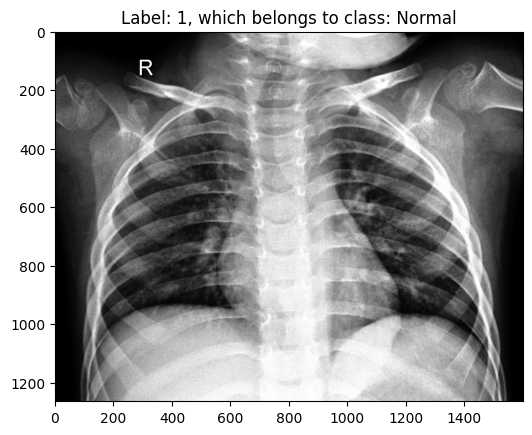

In [16]:
img, label = train_folder[112]

plt.imshow(img)
plt.title(f"Label: {label}, which belongs to class: {classes[label]}")
print(img.size)

(1336, 1024)


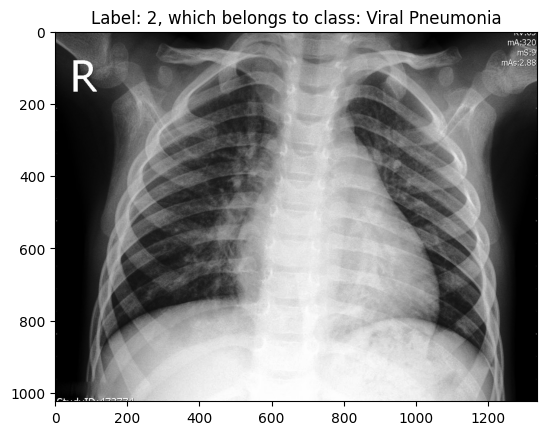

In [17]:
img, label = train_folder[200]

plt.imshow(img)
plt.title(f"Label: {label}, which belongs to class: {classes[label]}")
print(img.size)

(1695, 1570)


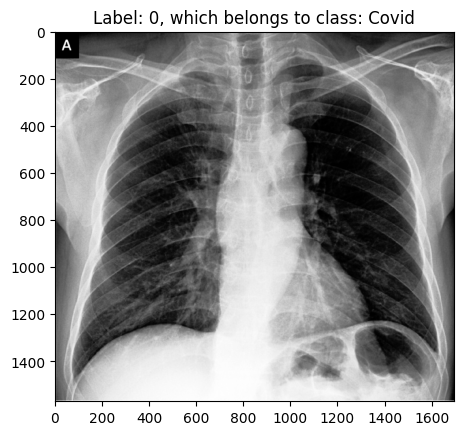

In [18]:
img, label = train_folder[29]
plt.imshow(img)
plt.title(f"Label: {label}, which belongs to class: {classes[label]}")
print(img.size)

## Transformation and Augmentation

In [19]:
train_set = ImageFolder(train_dir, transform.Compose([
    transform.Resize((250, 250)),            # Resize image to 256x256
    transform.RandomHorizontalFlip(p=0.5),   # Randomly flip the image horizontally
    transform.ToTensor(),                    # Convert the image to a PyTorch tensor
    transform.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
]))


test_set = ImageFolder(test_dir, transform.Compose([
    transform.Resize((250, 250)),
    transform.RandomHorizontalFlip(p=0.5),
    transform.ToTensor(),
    transform.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
]))

In [20]:
train_set

Dataset ImageFolder
    Number of datapoints: 251
    Root location: /content/drive/MyDrive/Kaggle/Covid19-dataset/train
    StandardTransform
Transform: Compose(
               Resize(size=(250, 250), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

## Visualize transformed images

<built-in method size of Tensor object at 0x79f35d2c8360>


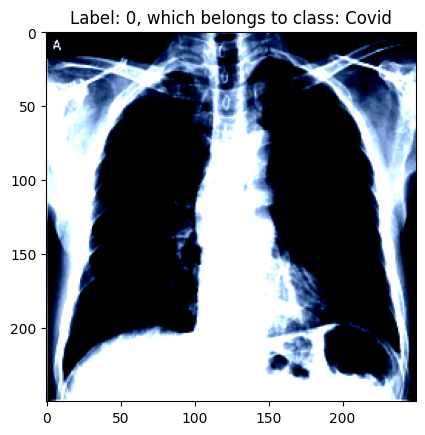

In [21]:
img, label = train_set[29]
plt.imshow(img.permute(1, 2, 0))
plt.title(f"Label: {label}, which belongs to class: {classes[label]}")
print(img.size)

<built-in method size of Tensor object at 0x79f35d0d7a10>


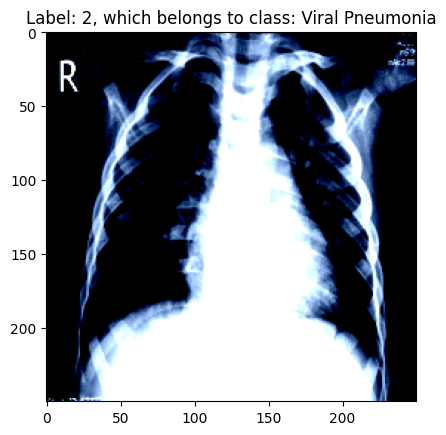

In [22]:
img, label = train_set[200]
plt.imshow(img.permute(1, 2, 0))
plt.title(f"Label: {label}, which belongs to class: {classes[label]}")
print(img.size)

<built-in method size of Tensor object at 0x79f35c71f600>


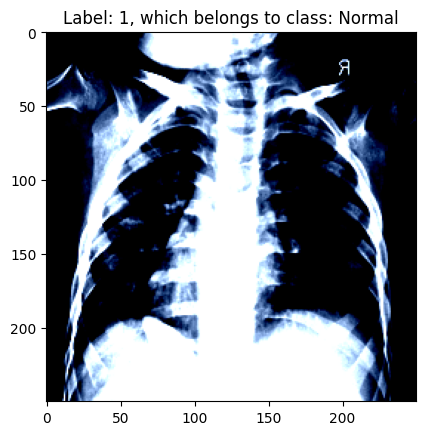

In [23]:
img, label = train_set[112]
plt.imshow(img.permute(1, 2, 0))
plt.title(f"Label: {label}, which belongs to class: {classes[label]}")
print(img.size)

In [24]:
len(train_set)

251

In [25]:
val_pct = 0.25
val_size = int(val_pct * len(train_set))
train_size = int(len(train_set) - val_size)
val_size, train_size

(62, 189)

In [26]:
train_ds, val_ds = random_split(train_set, [train_size, val_size])
len(train_ds), len(val_ds)

(189, 62)

In [27]:
train_dl = DataLoader(train_ds, batch_size=8, shuffle=True, num_workers=2, pin_memory=True)
val_dl = DataLoader(val_ds, batch_size=8, shuffle=False, num_workers=2, pin_memory=True)

## Visualize a batch of data

In [28]:
def visualize_batch(images, labels):
  grid_img = torchvision.utils.make_grid(images, nrow=8, padding=2)

  np_img = grid_img.numpy().transpose((1, 2, 0))

  plt.figure(figsize=(15, 15))
  plt.imshow(np_img)
  plt.title("Batch of images with labels")
  plt.axis("off")
  plt.show()

  for i in range(len(images)):
    img = images[i]
    label = labels[i].item()

    img = img.permute(1, 2, 0).numpy()

    plt.figure()
    plt.imshow(img)
    plt.title(f"Label: {label}, which is {classes[label]}")
    plt.axis("off")
    plt.show()

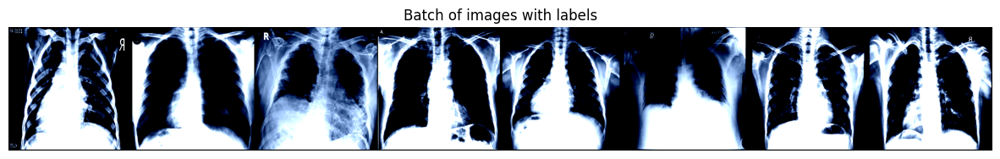

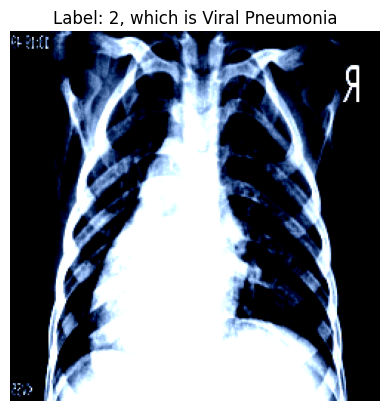

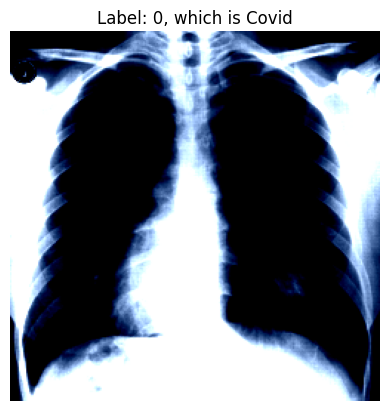

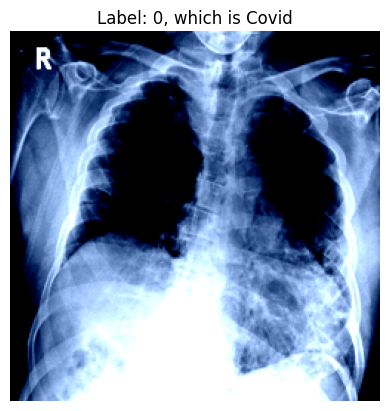

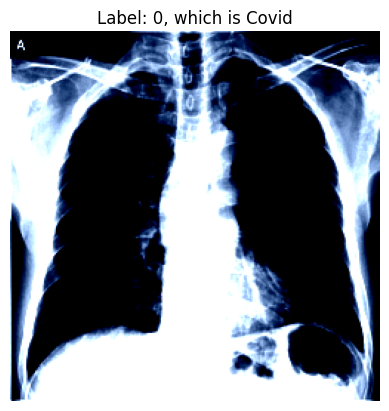

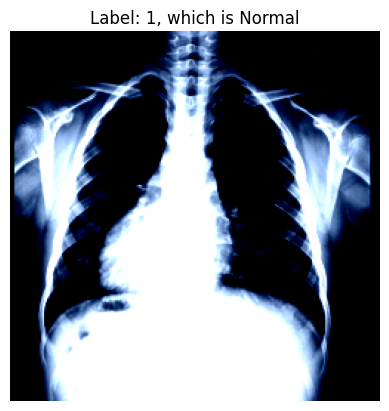

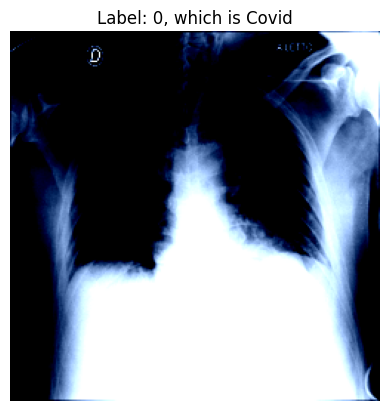

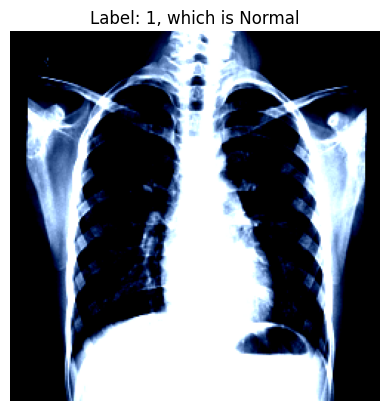

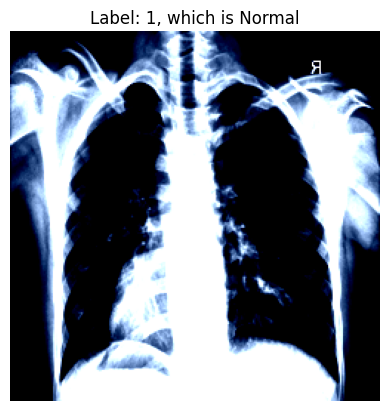

In [29]:
for batch in train_dl:
  images, labels = batch
  visualize_batch(images, labels)
  break

## Define the model

In [30]:
class Covid19Model0(nn.Module):
  def __init__(self):
    super(Covid19Model0, self).__init__()

    # Convolutional layers
    self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
    self.dropout1 = nn.Dropout(0.5)  # Dropout after conv1
    self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
    self.dropout2 = nn.Dropout(0.5)  # Dropout after conv2
    self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
    self.dropout3 = nn.Dropout(0.5)  # Dropout after conv3

    # Pooling layer
    self.pool = nn.MaxPool2d(2, 2)

    # Fully connected layers
    self.linear1 = nn.Linear(128 * 31 * 31, 256)
    self.dropout4 = nn.Dropout(0.5)  # Dropout after linear1
    self.linear2 = nn.Linear(256, 128)
    self.dropout5 = nn.Dropout(0.5)  # Dropout after linear2
    self.linear3 = nn.Linear(128, 64)
    self.dropout6 = nn.Dropout(0.5)  # Dropout after linear3
    self.linear4 = nn.Linear(64, 3)   # Output layer for 3 classes

  def forward(self, x):
    # Forward pass through the network
    x = F.relu(self.conv1(x))
    x = self.dropout1(x)
    x = self.pool(x)

    x = F.relu(self.conv2(x))
    x = self.dropout2(x)
    x = self.pool(x)

    x = F.relu(self.conv3(x))
    x = self.dropout3(x)
    x = self.pool(x)

    # Flatten the tensor for the fully connected layers
    x = x.view(-1, 128 * 31 * 31)

    x = F.relu(self.linear1(x))
    x = self.dropout4(x)

    x = F.relu(self.linear2(x))
    x = self.dropout5(x)

    x = F.relu(self.linear3(x))
    x = self.dropout6(x)

    x = self.linear4(x)  # Output layer
    return x

In [31]:
model0 = Covid19Model0()
model0

Covid19Model0(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dropout1): Dropout(p=0.5, inplace=False)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dropout2): Dropout(p=0.5, inplace=False)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dropout3): Dropout(p=0.5, inplace=False)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (linear1): Linear(in_features=123008, out_features=256, bias=True)
  (dropout4): Dropout(p=0.5, inplace=False)
  (linear2): Linear(in_features=256, out_features=128, bias=True)
  (dropout5): Dropout(p=0.5, inplace=False)
  (linear3): Linear(in_features=128, out_features=64, bias=True)
  (dropout6): Dropout(p=0.5, inplace=False)
  (linear4): Linear(in_features=64, out_features=3, bias=True)
)

In [32]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model0.parameters(), lr=0.0001)

## Training loop

### finding accuracy of first batch of images, step by step implementation

In [33]:
for images, labels in train_dl:
  outputs = model0(images)
  loss = criterion(outputs, labels)
  break

In [34]:
labels

tensor([0, 2, 1, 1, 2, 1, 0, 2])

In [35]:
labels.size()

torch.Size([8])

In [36]:
labels.size(0)

8

In [37]:
outputs

tensor([[ 1.5333e-01, -1.2701e-01,  3.2814e-02],
        [ 1.2858e-01, -1.4915e-04, -2.3665e-02],
        [ 1.4734e-01, -3.5334e-02, -4.3795e-02],
        [ 1.3673e-01, -7.1684e-02, -4.1354e-02],
        [ 1.3111e-01, -2.1588e-02,  4.9646e-02],
        [ 6.8158e-02,  5.6872e-03,  9.1880e-02],
        [-3.0298e-02, -6.9117e-03, -4.2431e-03],
        [ 1.4427e-01, -1.4980e-01,  1.7164e-02]], grad_fn=<AddmmBackward0>)

In [38]:
outputs.data

tensor([[ 1.5333e-01, -1.2701e-01,  3.2814e-02],
        [ 1.2858e-01, -1.4915e-04, -2.3665e-02],
        [ 1.4734e-01, -3.5334e-02, -4.3795e-02],
        [ 1.3673e-01, -7.1684e-02, -4.1354e-02],
        [ 1.3111e-01, -2.1588e-02,  4.9646e-02],
        [ 6.8158e-02,  5.6872e-03,  9.1880e-02],
        [-3.0298e-02, -6.9117e-03, -4.2431e-03],
        [ 1.4427e-01, -1.4980e-01,  1.7164e-02]])

In [39]:
torch.max(outputs.data, 1)

torch.return_types.max(
values=tensor([ 0.1533,  0.1286,  0.1473,  0.1367,  0.1311,  0.0919, -0.0042,  0.1443]),
indices=tensor([0, 0, 0, 0, 0, 2, 2, 0]))

In [40]:
_, predicted = torch.max(outputs.data, 1)
print(f"{_}\n\n{predicted}")

tensor([ 0.1533,  0.1286,  0.1473,  0.1367,  0.1311,  0.0919, -0.0042,  0.1443])

tensor([0, 0, 0, 0, 0, 2, 2, 0])


In [41]:
loss

tensor(1.1168, grad_fn=<NllLossBackward0>)

In [42]:
loss.item()

1.1168266534805298

In [43]:
example_tensor = torch.tensor([[0.2, 1.5, 0.3],
                         [2.0, 0.5, 0.3],
                         [0.1, 0.4, 1.2]])

torch.max(example_tensor, 1) # returns the max from each row, and its indices

torch.return_types.max(
values=tensor([1.5000, 2.0000, 1.2000]),
indices=tensor([1, 0, 2]))

### training and evaluating loop for model0

In [44]:
def train_and_evaluate(model, train_loader, val_loader, criterion, optimizer, num_epochs):
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    for epoch in range(num_epochs):
        # Training Phase
        model.train()
        total_loss_train = 0.0
        total_correct_train = 0
        total_images_train = 0

        for images, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            # Accumulate training metrics
            total_loss_train += loss.item() * labels.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total_images_train += labels.size(0)
            total_correct_train += (predicted == labels).sum().item()

        # Calculate training accuracy and loss
        train_accuracy = total_correct_train / total_images_train
        train_loss = total_loss_train / total_images_train
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)

        # Validation Phase
        model.eval()
        total_loss_val = 0.0
        total_correct_val = 0
        total_images_val = 0

        with torch.no_grad():
            for images, labels in val_loader:
                outputs = model(images)
                loss = criterion(outputs, labels)

                # Accumulate validation metrics
                total_loss_val += loss.item() * labels.size(0)
                _, predicted = torch.max(outputs.data, 1)
                total_images_val += labels.size(0)
                total_correct_val += (predicted == labels).sum().item()

        # Calculate validation accuracy and loss
        val_accuracy = total_correct_val / total_images_val
        val_loss = total_loss_val / total_images_val
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        # Print metrics after each epoch
        print(f"Epoch [{epoch+1}/{num_epochs}]")
        print(f"Training Accuracy: {train_accuracy*100:.2f}%, Training Loss: {train_loss:.4f}")
        print(f"Validation Accuracy: {val_accuracy*100:.2f}%, Validation Loss: {val_loss:.4f}\n")

        torch.save(model.state_dict(), f'/content/drive/MyDrive/models/m{epoch}.pth')


    return train_losses, train_accuracies, val_losses, val_accuracies

In [45]:
a, b=next(iter(train_dl))
a.shape

torch.Size([8, 3, 250, 250])

In [46]:
train_losses, train_accuracies, val_losses, val_accuracies = train_and_evaluate(
    model0, train_dl, val_dl, criterion, optimizer, num_epochs=50
)

Epoch [1/50]
Training Accuracy: 32.80%, Training Loss: 1.2293
Validation Accuracy: 67.74%, Validation Loss: 1.0807

Epoch [2/50]
Training Accuracy: 46.56%, Training Loss: 1.0725
Validation Accuracy: 67.74%, Validation Loss: 1.0737

Epoch [3/50]
Training Accuracy: 50.26%, Training Loss: 0.9968
Validation Accuracy: 69.35%, Validation Loss: 1.0242

Epoch [4/50]
Training Accuracy: 57.14%, Training Loss: 0.9296
Validation Accuracy: 74.19%, Validation Loss: 0.9701

Epoch [5/50]
Training Accuracy: 61.38%, Training Loss: 0.7868
Validation Accuracy: 74.19%, Validation Loss: 0.9255

Epoch [6/50]
Training Accuracy: 55.03%, Training Loss: 0.8676
Validation Accuracy: 74.19%, Validation Loss: 0.9517

Epoch [7/50]
Training Accuracy: 63.49%, Training Loss: 0.8379
Validation Accuracy: 74.19%, Validation Loss: 0.9242

Epoch [8/50]
Training Accuracy: 67.72%, Training Loss: 0.7031
Validation Accuracy: 80.65%, Validation Loss: 0.8309

Epoch [9/50]
Training Accuracy: 70.37%, Training Loss: 0.6519
Validation

#### training and validation accuracy

## Visualizing images in test set

In [47]:
test_dl = DataLoader(test_set, batch_size=8, shuffle=False, num_workers=2, pin_memory=True)

In [48]:
test_dl

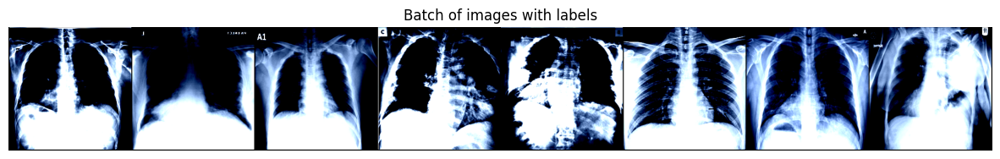

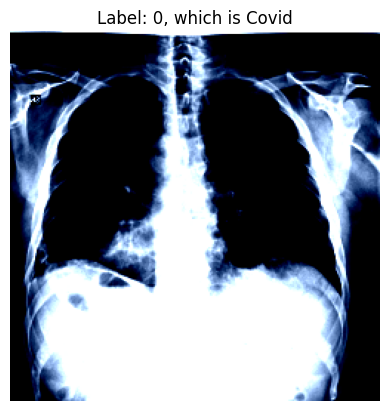

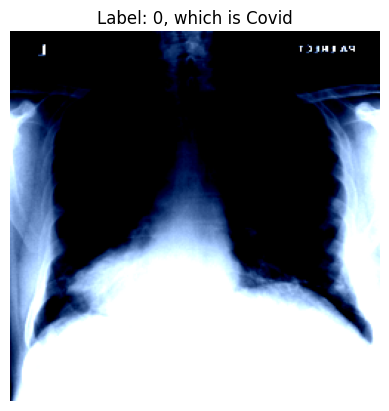

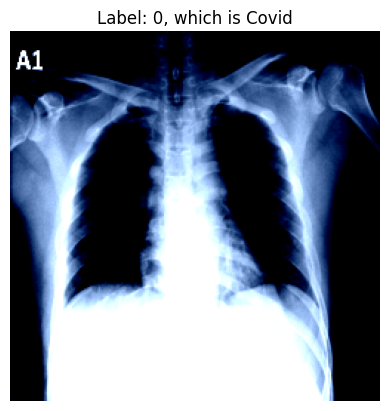

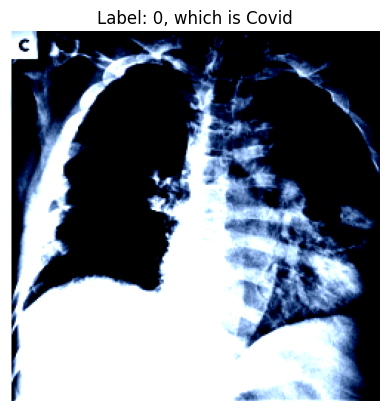

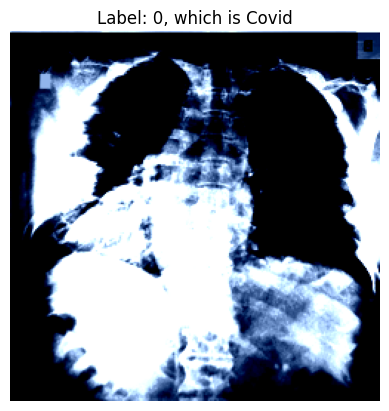

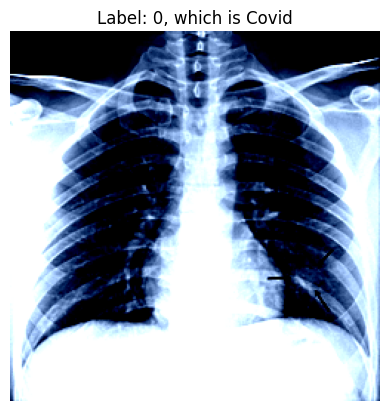

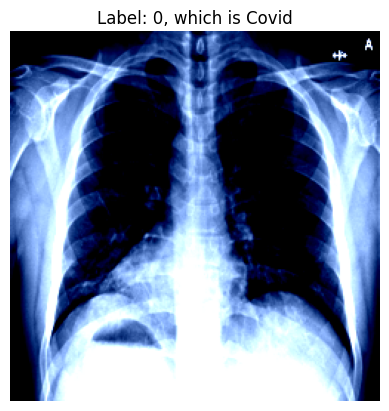

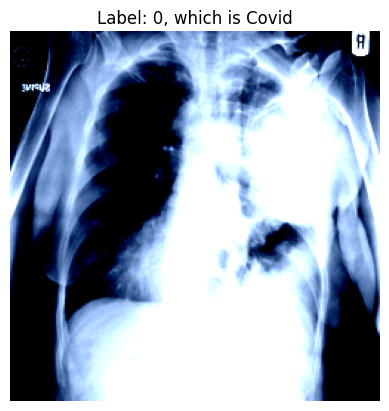

In [49]:
for images, labels in test_dl:
  visualize_batch(images, labels)
  break

## Plot predictions

In [50]:
plt.rcParams['axes.titlesize'] = 12

def plot_predictions(model, data_loader):
    model.eval()

    # Get the total number of images in the dataset
    total_images = len(data_loader.dataset)

    random_indices = random.sample(range(total_images), min(16, total_images))

    selected_images = []
    selected_labels = []

    for idx in random_indices:
        img, label = data_loader.dataset[idx]
        selected_images.append(img)
        selected_labels.append(label)

    # Convert the list of images to a tensor for batch processing
    selected_images = torch.stack(selected_images)
    selected_labels = torch.tensor(selected_labels)

    # Get the model outputs
    outputs = model(selected_images)
    _, predicted = torch.max(outputs.data, 1)

    plt.figure(figsize=(20, 20))
    num_images = selected_images.size(0)
    for i in range(num_images):
        plt.subplot(4, 4, i + 1)
        img = selected_images[i].permute(1, 2, 0).numpy()

        # Rescale the image if it's normalized
        img = (img - img.min()) / (img.max() - img.min())

        plt.imshow(img)
        plt.title(f'True: {classes[selected_labels[i]]}, Predicted: {classes[predicted[i]]}')
        plt.axis('off')

    plt.show()

### plot predictions of train set

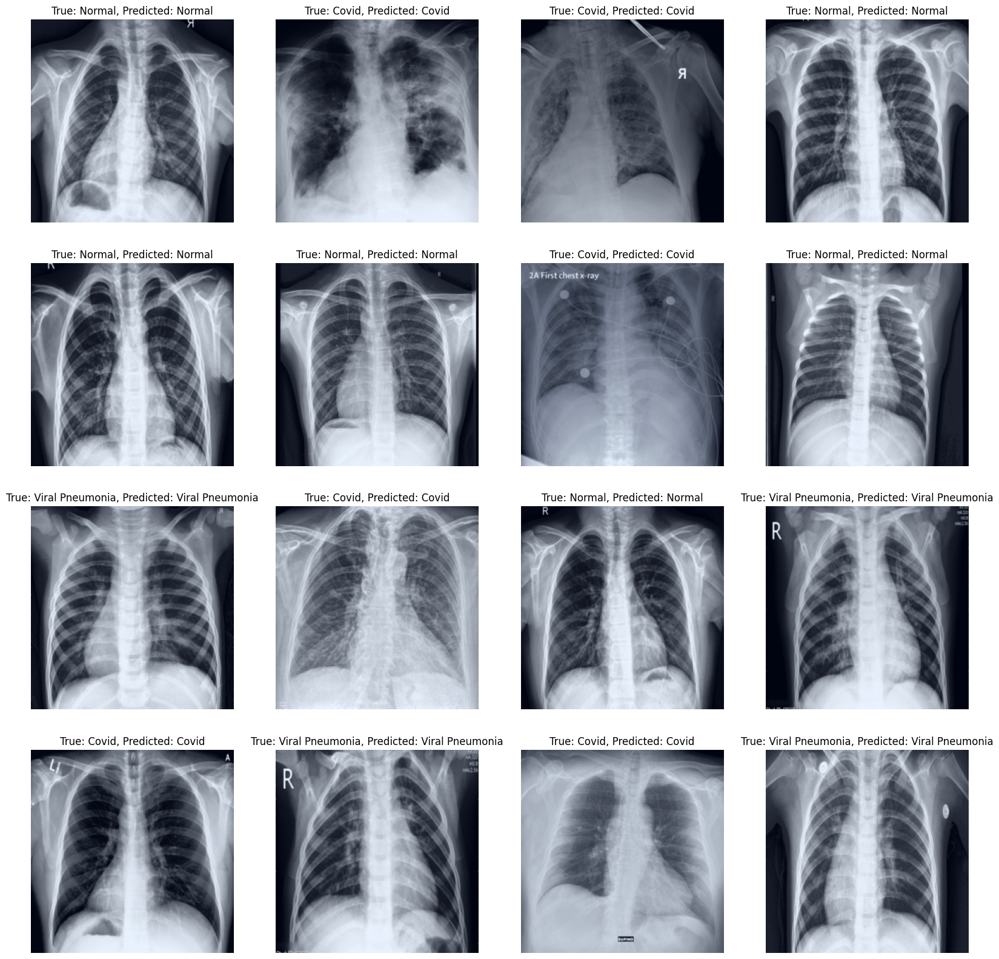

In [51]:
plot_predictions(model0, train_dl)

### plot predictions of validation set

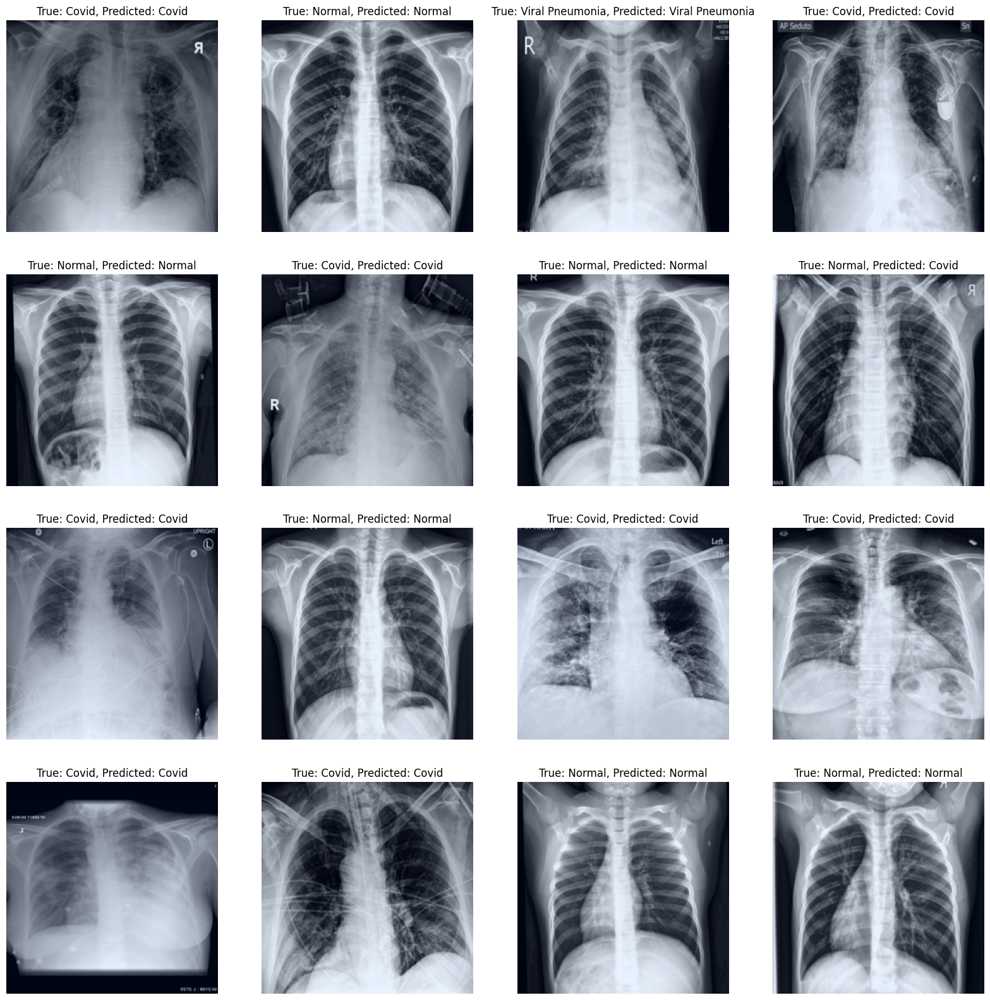

In [52]:
plot_predictions(model0, val_dl)

### plot predictions of test set

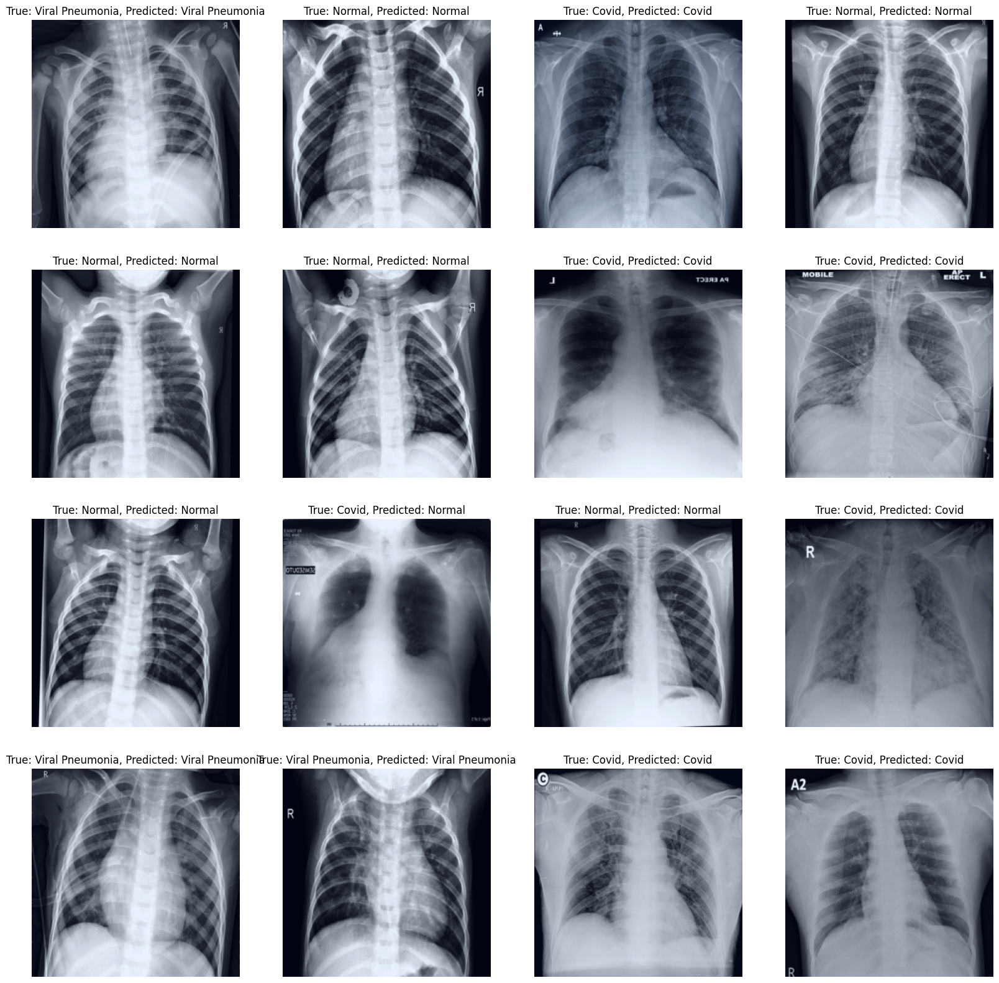

In [53]:
plot_predictions(model0, test_dl)

## Plot loss and accuracy curves

In [54]:
def plot_training_history(train_losses, train_accuracies, val_losses, val_accuracies):
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(12, 5))

    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, 'b', label='Training loss')
    plt.plot(epochs, val_losses, 'r', label='Validation loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, [acc * 100 for acc in train_accuracies], 'b', label='Training accuracy')
    plt.plot(epochs, [acc * 100 for acc in val_accuracies], 'r', label='Validation accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.legend()

    plt.show()

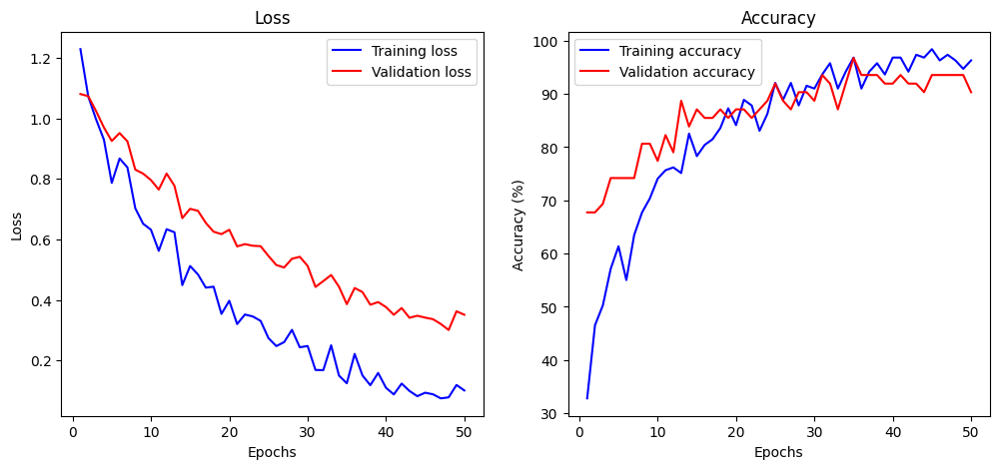

In [55]:
plot_training_history(train_losses, train_accuracies, val_losses, val_accuracies)